# Instalacija potrebnih paketa (ako već nisu instalirani)


In [1]:
!pip install scikit-learn opencv-python pillow tensorflow==2.8.0 matplotlib

ERROR: Could not find a version that satisfies the requirement tensorflow==2.8.0 (from versions: 2.16.0rc0, 2.16.1, 2.16.2, 2.17.0rc0, 2.17.0rc1, 2.17.0)
ERROR: No matching distribution found for tensorflow==2.8.0

[notice] A new release of pip is available: 24.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# Import necessary libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, regularizers, callbacks
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras import backend as K
import time
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import warnings
import pathlib
import cv2
import random
from PIL import Image
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
from sklearn.model_selection import train_test_split

Funckije korištene u projektu

In [65]:
# Plotting the accuracy of the model over epochs
def plot_model_accuracy(history):
    loss_train = history.history['accuracy']
    loss_val = history.history['val_accuracy']
    epochs = range(1, len(loss_train)+1)
    plt.plot(epochs, loss_train, 'g', label='Training accuracy')
    plt.plot(epochs, loss_val, 'b', label='Validation accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)
    plt.legend()
    plt.show()

# Plotting the model's loss over epochs
def plot_model_loss(history):
    loss_train = history.history['loss']
    loss_val = history.history['val_loss']
    epochs = range(1, len(loss_train)+1)
    plt.plot(epochs, loss_train, 'g', label='Training loss')
    plt.plot(epochs, loss_val, 'b', label='Validation loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.ylim(0, 10)
    plt.legend()
    plt.show()

# Generate classification report and confusion matrix
def generate_report_and_matrix(model_path, X_val, y_val):
    best_model = models.load_model(model_path)
    loss, accuracy = best_model.evaluate(X_val, y_val)

    y_pred = best_model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)

    conf_matrix = confusion_matrix(y_val, y_pred_classes)
    class_report = classification_report(y_val, y_pred_classes, target_names=[str(i) for i in range(100)])
    print("Classification Report:\n")
    print(class_report)
    
    return conf_matrix

# Plot confusion matrix
def plot_confusion_matrix(conf_matrix, category_names):
    plt.figure(figsize=(20, 20))
    sns.set(font_scale=1.4)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=category_names, yticklabels=category_names, annot_kws={"size": 12})
    plt.xticks(rotation=90, fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

# Bar plot of predictions by category
def plot_predictions(y_test, y_pred_classes, category_names):
    correct = (y_test == y_pred_classes).astype(int)  # Array indicating correct predictions
    correct_dict = {category: [0, 0] for category in category_names}

    for i in range(len(y_test)):
        category = category_names[y_test[i]]
        if correct[i] == 1:
            correct_dict[category][0] += 1
        else:
            correct_dict[category][1] += 1

    correct_df = pd.DataFrame(correct_dict).T
    correct_df.columns = ['Točno', 'Netočno']

    plt.figure(figsize=(20, 8))  # Wider plot to fit all categories
    ax = correct_df.plot(kind='bar', stacked=True, color=['blue', 'orange'], figsize=(20, 8))
    plt.title('Predikcije po kategorijama', fontsize=16)
    plt.xlabel('Kategorija', fontsize=14)
    plt.ylabel('Broj predikcija', fontsize=14)
    plt.xticks(rotation=90, fontsize=10)  # Rotate category names to avoid overlap
    plt.yticks(fontsize=12)
    plt.legend(title='Točnost', fontsize=12)
    plt.tight_layout()
    plt.show()

# Print training results
def print_training_results(history, start_time, end_time):
    duration = end_time - start_time
    print(f"Training duration: {round(duration, 4)} seconds")
    print(f"Final training accuracy: {round(history.history['accuracy'][-1], 4)}")
    print(f"Final validation accuracy: {round(history.history['val_accuracy'][-1], 4)}")
    print(f"Final training loss: {round(history.history['loss'][-1], 4)}")
    print(f"Final validation loss: {round(history.history['val_loss'][-1], 4)}")

Funkcije za pregled slika

In [4]:
# Display a specific image
def plot_image(X, y, index):
    plt.figure(figsize=(10, 10))
    plt.imshow(X[index])
    plt.xlabel(y[index])
    plt.show()

# List and open an image from a local directory
def list_and_open_image(data_dir_path, category_name, image_index):
    data_dir = pathlib.Path(data_dir_path)
    category_images = list(data_dir.glob(f'{category_name}/*'))
    print(category_images[:5])  # Show first 5 image paths
    image = Image.open(str(category_images[image_index]))
    image.show()

# Randomly plot images from different categories
def plot_images(combined_dict):
    fig, ax = plt.subplots(10, 10, figsize=(20, 20))
    ax = ax.flatten()
    for i, (category_name, category_info) in enumerate(combined_dict.items()):
        if len(category_info['images']) > 0:
            random_index = random.randint(0, len(category_info['images']) - 1)
            img = cv2.imread(str(category_info['images'][random_index]))
            if img is not None:
                ax[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            ax[i].set_title(category_name, fontsize=8)
            ax[i].axis('off')
        else:
            ax[i].axis('off')
    plt.tight_layout()
    plt.show()

# Check image size for a random image
def image_size_check(combined_dict):
    random_category = random.choice(list(combined_dict.keys()))
    random_index = random.randint(0, len(combined_dict[random_category]['images']) - 1)
    img = cv2.imread(str(combined_dict[random_category]['images'][random_index]))
    return img.shape

Ucitavanje podataka

In [5]:
# Dataset directory
data_dir_path = 'resized data'
data_dir = pathlib.Path(data_dir_path)

# Create a dictionary with categories and their labels
def create_category_dict(directory):
    category_dict = {}
    for i, category_path in enumerate(sorted(directory.iterdir())):
        if category_path.is_dir():
            category_dict[category_path.name] = {
                'images': list(category_path.glob('*')),
                'label': i
            }
    return category_dict

# Create the dictionary dataset
butterflies_dict = create_category_dict(data_dir)

# Display the first few categories to check
for category, info in list(butterflies_dict.items())[:5]:
    print(f"Category: {category}, Number of images: {len(info['images'])}, Label: {info['label']}")


Category: ADONIS, Number of images: 131, Label: 0
Category: AFRICAN GIANT SWALLOWTAIL, Number of images: 112, Label: 1
Category: AMERICAN SNOOT, Number of images: 110, Label: 2
Category: AN 88, Number of images: 126, Label: 3
Category: APPOLLO, Number of images: 133, Label: 4


In [6]:
# TOTAL NUMBER OF IMAGES
br_slika = len(list(data_dir.glob('*/*.jpg')))
butterflies = [str(butterfly).split('/')[-1] for butterfly in butterflies_dict.keys()]
print(f'{butterflies},\n Ukupni broj slika: {br_slika}')

['ADONIS', 'AFRICAN GIANT SWALLOWTAIL', 'AMERICAN SNOOT', 'AN 88', 'APPOLLO', 'ARCIGERA FLOWER MOTH', 'ATALA', 'ATLAS MOTH', 'BANDED ORANGE HELICONIAN', 'BANDED PEACOCK', 'BANDED TIGER MOTH', 'BECKERS WHITE', 'BIRD CHERRY ERMINE MOTH', 'BLACK HAIRSTREAK', 'BLUE MORPHO', 'BLUE SPOTTED CROW', 'BROOKES BIRDWING', 'BROWN ARGUS', 'BROWN SIPROETA', 'CABBAGE WHITE', 'CAIRNS BIRDWING', 'CHALK HILL BLUE', 'CHECQUERED SKIPPER', 'CHESTNUT', 'CINNABAR MOTH', 'CLEARWING MOTH', 'CLEOPATRA', 'CLODIUS PARNASSIAN', 'CLOUDED SULPHUR', 'COMET MOTH', 'COMMON BANDED AWL', 'COMMON WOOD-NYMPH', 'COPPER TAIL', 'CRECENT', 'CRIMSON PATCH', 'DANAID EGGFLY', 'EASTERN COMA', 'EASTERN DAPPLE WHITE', 'EASTERN PINE ELFIN', 'ELBOWED PIERROT', 'EMPEROR GUM MOTH', 'GARDEN TIGER MOTH', 'GIANT LEOPARD MOTH', 'GLITTERING SAPPHIRE', 'GOLD BANDED', 'GREAT EGGFLY', 'GREAT JAY', 'GREEN CELLED CATTLEHEART', 'GREEN HAIRSTREAK', 'GREY HAIRSTREAK', 'HERCULES MOTH', 'HUMMING BIRD HAWK MOTH', 'INDRA SWALLOW', 'IO MOTH', 'Iphiclus si

In [7]:
# NUMBER OF IMAGES PER BUTTERFLY SPECIES
for ime, info in butterflies_dict.items():
    print(f"{ime}: {len(info['images'])} slika")

ADONIS: 131 slika
AFRICAN GIANT SWALLOWTAIL: 112 slika
AMERICAN SNOOT: 110 slika
AN 88: 126 slika
APPOLLO: 133 slika
ARCIGERA FLOWER MOTH: 145 slika
ATALA: 148 slika
ATLAS MOTH: 134 slika
BANDED ORANGE HELICONIAN: 144 slika
BANDED PEACOCK: 123 slika
BANDED TIGER MOTH: 141 slika
BECKERS WHITE: 121 slika
BIRD CHERRY ERMINE MOTH: 138 slika
BLACK HAIRSTREAK: 126 slika
BLUE MORPHO: 112 slika
BLUE SPOTTED CROW: 128 slika
BROOKES BIRDWING: 170 slika
BROWN ARGUS: 174 slika
BROWN SIPROETA: 145 slika
CABBAGE WHITE: 132 slika
CAIRNS BIRDWING: 122 slika
CHALK HILL BLUE: 154 slika
CHECQUERED SKIPPER: 141 slika
CHESTNUT: 127 slika
CINNABAR MOTH: 136 slika
CLEARWING MOTH: 127 slika
CLEOPATRA: 138 slika
CLODIUS PARNASSIAN: 127 slika
CLOUDED SULPHUR: 133 slika
COMET MOTH: 110 slika
COMMON BANDED AWL: 128 slika
COMMON WOOD-NYMPH: 133 slika
COPPER TAIL: 138 slika
CRECENT: 143 slika
CRIMSON PATCH: 108 slika
DANAID EGGFLY: 140 slika
EASTERN COMA: 137 slika
EASTERN DAPPLE WHITE: 137 slika
EASTERN PINE ELFIN

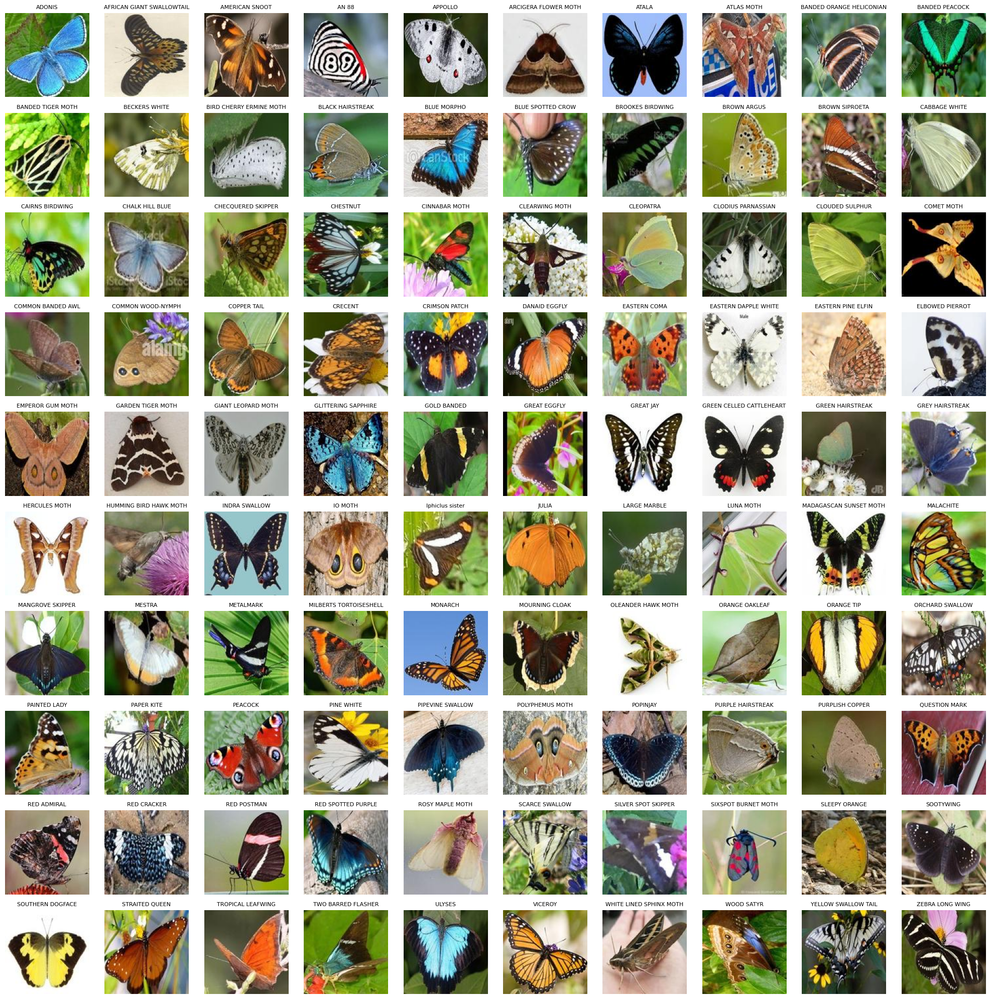

In [8]:
# Overview of images for each butterfly species from the dataset
plot_images(butterflies_dict)

In [9]:
# Checking image dimensions
image_size_check(butterflies_dict)

(128, 128, 3)

In [10]:
# NUMBER OF CLASSES (100 butterfly categories)
num_classes = 100

# X - images, y - labels
X, y = [], []

for category_name, category_info in butterflies_dict.items():
    for image_path in category_info['images']:
        img = cv2.imread(str(image_path))
        if img is not None:
            X.append(img)
            y.append(category_info['label'])
        else:
            print(f"Image at {image_path} could not be read.")

In [11]:
# Checking image dimensions
print(f"X shape: {X[0].shape}\ny shape: {len(y)}")

X shape: (128, 128, 3)
y shape: 13094


In [12]:
#Numpy array
X = np.array(X)
y = np.array(y)


In [13]:
# Splitting data into training and testing sets (80% training, 20% testing)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.20, random_state=69)

# Checking dimensions
print("Training set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_val.shape, y_val.shape)


Training set shape: (10475, 128, 128, 3) (10475,)
Validation set shape: (2619, 128, 128, 3) (2619,)


In [14]:
# Normalisation of images
X_train = X_train / 255.0
X_val = X_val / 255.0

Treniranje modela

Alpha model

In [15]:
# Defining model
img_size = 128
num_classes = 100
model = models.Sequential(name="AlphaModel")
model.add(layers.Conv2D(16, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(num_classes, activation='softmax'))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

c:\Users\nikol\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "AlphaModel"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 28800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │     1,843,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │         6,500 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,854,852 (7.08 MB)

 Trainable params: 1,854,852 (7.08 MB)

 Non-trainable params: 0 (0.00 B)

In [16]:
start_time = time.time()
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
epochs = 50
batch_size = 32
history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), callbacks=[callback])
end_time = time.time()
print(f"Training completed in {(end_time - start_time):.2f} seconds")


Epoch 1/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - accuracy: 0.0230 - loss: 4.5619 - val_accuracy: 0.0645 - val_loss: 4.0097
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.1124 - loss: 3.6964 - val_accuracy: 0.1932 - val_loss: 3.0691
Epoch 3/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.2313 - loss: 2.8354 - val_accuracy: 0.2234 - val_loss: 2.9326
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.3236 - loss: 2.4699 - val_accuracy: 0.2757 - val_loss: 2.7373
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.3888 - loss: 2.1456 - val_accuracy: 0.3184 - val_loss: 2.6049
Epoch 6/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.4666 - loss: 1.8450 - val_accuracy: 0.3234 - val_loss: 2.6373
Epoch 7/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5257 - loss: 1.6209 - val_accuracy: 0.3421 - val_loss: 2.6199
Epoch 8/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.5919 - loss: 1.3861 - 

In [17]:
print_training_results(history, start_time, end_time)

Training duration: 249.7025 seconds
Final training accuracy: 0.6779
Final validation accuracy: 0.3501
Final training loss: 1.0499
Final validation loss: 3.1698


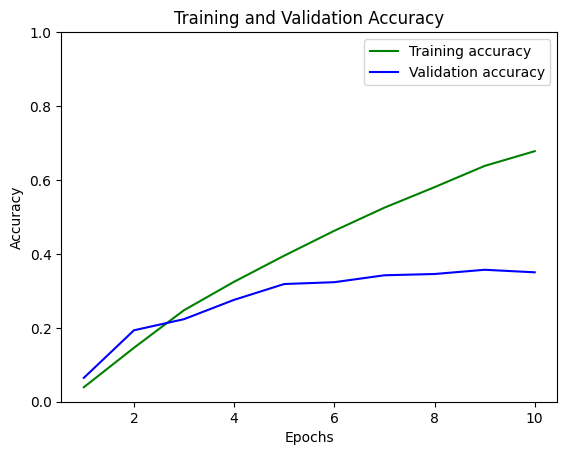

In [18]:
plot_model_accuracy(history)

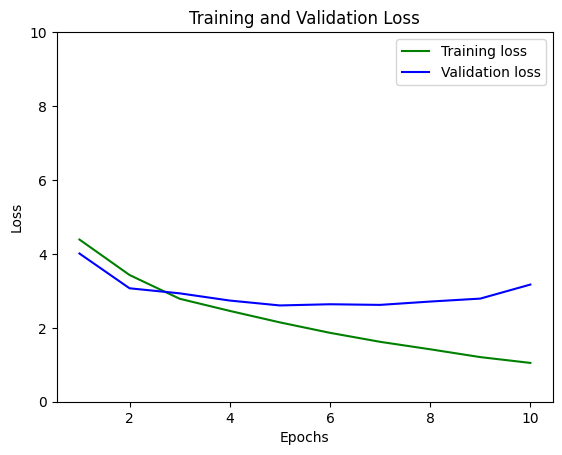

In [19]:
plot_model_loss(history)

In [20]:
K.clear_session()
# Clears the current TensorFlow session and releases memory by removing all nodes left over from previous models.

Beta Model

In [21]:
img_size = 128
num_classes = 100
model = models.Sequential(name='BetaModel')

model.add(layers.Conv2D(16, (3, 3), padding='same', input_shape=(img_size, img_size, 3)))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))

model.add(layers.Conv2D(32, (3, 3), padding='same'))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.3))

model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dropout(0.4))
model.add(layers.Dense(num_classes, activation='softmax'))

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

c:\Users\nikol\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\activations\leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "BetaModel"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │     2,097,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │         6,500 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,108,804 (8.04 MB)

 Trainable params: 2,108,804 (8.04 MB)

 Non-trainable params: 0 (0.00 B)

In [22]:
start_time = time.time()
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
epochs = 50
batch_size = 32
history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), callbacks=[callback])
end_time = time.time()
print(f"Training completed in {(end_time - start_time):.2f} seconds")

Epoch 1/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step - accuracy: 0.0117 - loss: 4.6170 - val_accuracy: 0.0263 - val_loss: 4.5119
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - accuracy: 0.0218 - loss: 4.4664 - val_accuracy: 0.0435 - val_loss: 4.2472
Epoch 3/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - accuracy: 0.0297 - loss: 4.2845 - val_accuracy: 0.0668 - val_loss: 4.0374
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - accuracy: 0.0424 - loss: 4.1488 - val_accuracy: 0.0913 - val_loss: 3.8464
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - accuracy: 0.0583 - loss: 3.9534 - val_accuracy: 0.1630 - val_loss: 3.5419
Epoch 6/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - accuracy: 0.0854 - loss: 3.7410 - val_accuracy: 0.2153 - val_loss: 3.2212
Epoch 7/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - accuracy: 0.1339 - loss: 3.4746 - val_accuracy: 0.2684 - val_loss: 2.9558
Epoch 8/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - accuracy: 0.1872 - loss: 3.2034 -

In [23]:
print_training_results(history, start_time, end_time)

Training duration: 743.5934 seconds
Final training accuracy: 0.7166
Final validation accuracy: 0.5346
Final training loss: 0.9212
Final validation loss: 2.0306


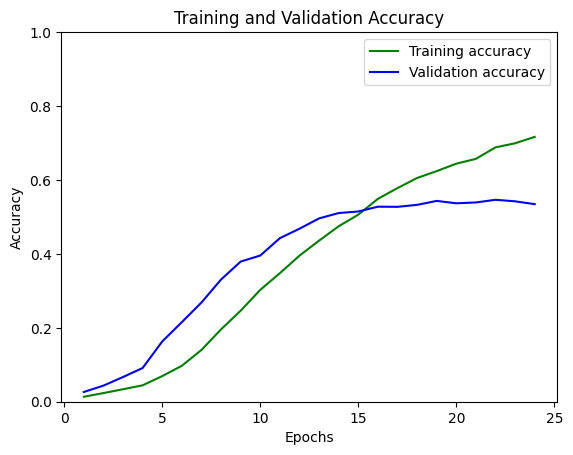

In [24]:
plot_model_accuracy(history)

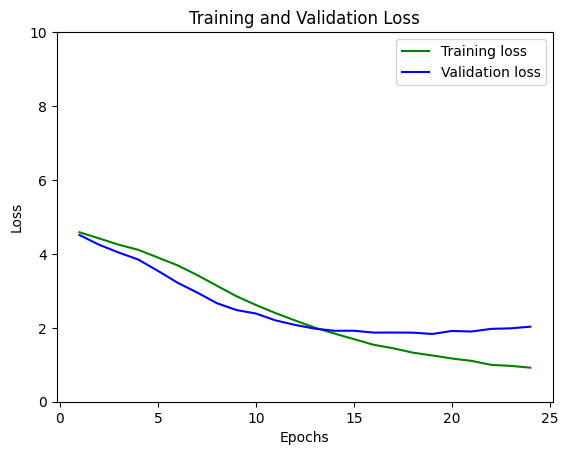

In [25]:
plot_model_loss(history)

In [26]:
K.clear_session()

Dodan Data Augmentation prije treniranja Gamma Modela

In [27]:
# Data Augmentation
data_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

Gamma Model

In [28]:
img_size = 128
num_classes = 100
model = models.Sequential(name='GammaModel')

model.add(layers.Conv2D(16, (3, 3), padding='same', input_shape=(img_size, img_size, 3)))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))

model.add(layers.Conv2D(32, (3, 3), padding='same'))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.3))

model.add(layers.Conv2D(64, (3, 3), padding='same'))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.4))

model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(num_classes, activation='softmax'))

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "GammaModel"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     2,097,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        12,900 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,133,764 (8.14 MB)

 Trainable params: 2,133,764 (8.14 MB)

 Non-trainable params: 0 (0.00 B)

In [29]:
start_time = time.time()
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
epochs = 50
batch_size = 32
train_generator = data_gen.flow(X_train, y_train, batch_size=batch_size)
history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), callbacks=[callback])
end_time = time.time()
print(f"Training completed in {(end_time - start_time):.2f} seconds")


Epoch 1/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - accuracy: 0.0171 - loss: 4.5788 - val_accuracy: 0.1107 - val_loss: 4.1639
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 36s 111ms/step - accuracy: 0.0900 - loss: 3.9961 - val_accuracy: 0.2833 - val_loss: 3.3040
Epoch 3/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 36s 110ms/step - accuracy: 0.1746 - loss: 3.3698 - val_accuracy: 0.3849 - val_loss: 2.6855
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 35s 108ms/step - accuracy: 0.2602 - loss: 2.9264 - val_accuracy: 0.4483 - val_loss: 2.3656
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - accuracy: 0.3243 - loss: 2.6320 - val_accuracy: 0.4845 - val_loss: 2.0741
Epoch 6/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 36s 109ms/step - accuracy: 0.3777 - loss: 2.3517 - val_accuracy: 0.5155 - val_loss: 1.9167
Epoch 7/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 35s 107ms/step - accuracy: 0.4435 - loss: 2.0861 - val_accuracy: 0.5433 - val_loss: 1.7739
Epoch 8/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 36s 108ms/step - accuracy: 0.4825 - loss: 1

In [30]:
print_training_results(history, start_time, end_time)


Training duration: 896.067 seconds
Final training accuracy: 0.8097
Final validation accuracy: 0.6697
Final training loss: 0.6009
Final validation loss: 1.4119


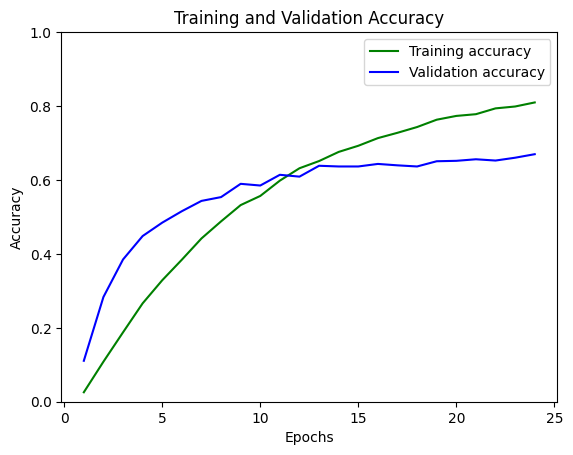

In [31]:
plot_model_accuracy(history)

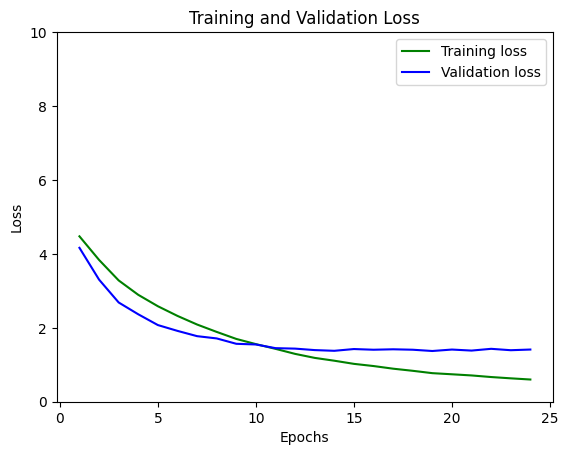

In [32]:
plot_model_loss(history)

Brisanje trenutne sesije i oslobađavanje memorije uklanjanjem svih preostalih nodova iz prethodnih modela.
Nadograden Data Augmentation prije treniranja Delta Modela

In [33]:
K.clear_session()
# Data Augmentation
data_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

Delta Model

In [34]:
img_size = 128
num_classes = 100
model = models.Sequential(name='DeltaModel')

# Regularization configuration
l1_l2 = regularizers.l1_l2(l1=0.0001, l2=0.0001)

model.add(layers.Conv2D(24, (3, 3), padding='same', input_shape=(img_size, img_size, 3), kernel_regularizer=l1_l2))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.1))  

model.add(layers.Conv2D(48, (3, 3), padding='same', kernel_regularizer=l1_l2))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2)) 

model.add(layers.Conv2D(96, (3, 3), padding='same', kernel_regularizer=l1_l2))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.25)) 

model.add(layers.Flatten())
model.add(layers.Dense(192, activation='relu', kernel_regularizer=l1_l2))
model.add(layers.Dropout(0.4))  
model.add(layers.Dense(num_classes, activation='softmax'))

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()


Model: "DeltaModel"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 24)   │           672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 128, 128, 24)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 24)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 24)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 48)     │        10,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 64, 64, 48)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 48)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 48)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 96)     │        41,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 24576)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 192)            │     4,718,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 192)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        19,300 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,790,740 (18.28 MB)

 Trainable params: 4,790,740 (18.28 MB)

 Non-trainable params: 0 (0.00 B)

In [35]:
start_time = time.time()
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
epochs = 50
batch_size = 32

train_generator = data_gen.flow(X_train, y_train, batch_size=batch_size)
history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), callbacks=[callback])
end_time = time.time()

print(f"Training completed in {(end_time - start_time):.2f} seconds")

Epoch 1/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 86s 254ms/step - accuracy: 0.0132 - loss: 7.5185 - val_accuracy: 0.0485 - val_loss: 5.4934
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 81s 246ms/step - accuracy: 0.0627 - loss: 5.2179 - val_accuracy: 0.1546 - val_loss: 4.5677
Epoch 3/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 80s 242ms/step - accuracy: 0.1329 - loss: 4.5328 - val_accuracy: 0.2703 - val_loss: 4.0312
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 79s 241ms/step - accuracy: 0.2146 - loss: 4.0738 - val_accuracy: 0.3471 - val_loss: 3.6270
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 78s 237ms/step - accuracy: 0.2618 - loss: 3.7978 - val_accuracy: 0.4028 - val_loss: 3.4249
Epoch 6/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 79s 239ms/step - accuracy: 0.3223 - loss: 3.5085 - val_accuracy: 0.4357 - val_loss: 3.2939
Epoch 7/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 79s 241ms/step - accuracy: 0.3653 - loss: 3.3604 - val_accuracy: 0.4570 - val_loss: 3.1322
Epoch 8/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 76s 231ms/step - accuracy: 0.4106 - loss: 3

In [36]:
print_training_results(history, start_time, end_time)

Training duration: 2652.8576 seconds
Final training accuracy: 0.7661
Final validation accuracy: 0.6082
Final training loss: 1.7503
Final validation loss: 2.4759


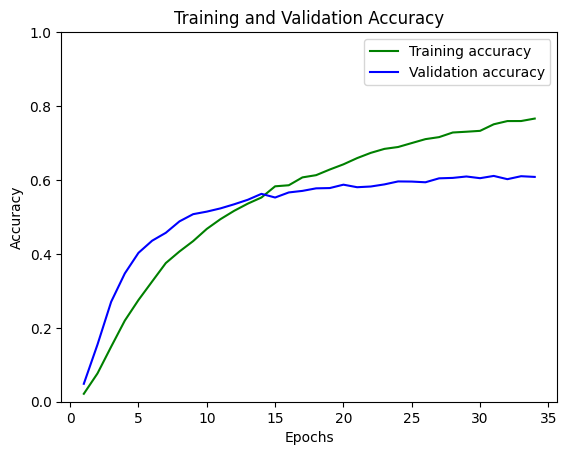

In [37]:
plot_model_accuracy(history)

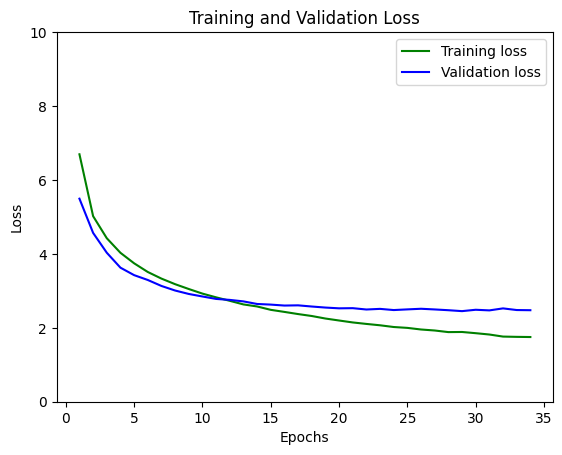

In [38]:
plot_model_loss(history)

Epsilon Model

In [39]:
model = models.Sequential(name="EpsilonModel")

input_size = (128, 128, 3)

model.add(layers.Conv2D(32, (3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.001), input_shape=input_size))
model.add(layers.BatchNormalization())
model.add(layers.Conv2D(32, (3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.25))

model.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(layers.BatchNormalization())
model.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.25))

model.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(layers.BatchNormalization())
model.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.25))

model.add(layers.Conv2D(256, (3, 3), padding='same', activation='leaky_relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(layers.BatchNormalization())
model.add(layers.Conv2D(256, (3, 3), padding='same', activation='leaky_relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.25))

model.add(layers.Conv2D(256, (3, 3), padding='same', activation='leaky_relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(layers.BatchNormalization())
model.add(layers.Conv2D(256, (3, 3), padding='same', activation='leaky_relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.25))

model.add(layers.Conv2D(512, (3, 3), padding='same', activation='leaky_relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(layers.BatchNormalization())
model.add(layers.Conv2D(512, (3, 3), padding='same', activation='leaky_relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(layers.Dropout(0.26))

model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(layers.Dropout(0.26))
model.add(layers.Dense(100, activation='softmax')) 

model.summary()


Model: "EpsilonModel"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 16, 16, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 8, 8, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 14,389,508 (54.89 MB)

 Trainable params: 14,387,012 (54.88 MB)

 Non-trainable params: 2,496 (9.75 KB)

In [40]:
start_time = time.time()

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3)

epochs = 100
batch_size = 64
history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, 
                    validation_data=(X_val, y_val), 
                    callbacks=[early_stopping, lr_scheduler])

end_time = time.time()
print(f"Training completed in {(end_time - start_time):.2f} seconds")


Epoch 1/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 468s 3s/step - accuracy: 0.0389 - loss: 8.4669 - val_accuracy: 0.0107 - val_loss: 9.8477 - learning_rate: 1.0000e-04
Epoch 2/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 445s 3s/step - accuracy: 0.2203 - loss: 7.0504 - val_accuracy: 0.0199 - val_loss: 10.2786 - learning_rate: 1.0000e-04
Epoch 3/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 434s 3s/step - accuracy: 0.3794 - loss: 6.1958 - val_accuracy: 0.0252 - val_loss: 10.5635 - learning_rate: 1.0000e-04
Epoch 4/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 434s 3s/step - accuracy: 0.4716 - loss: 5.6988 - val_accuracy: 0.1016 - val_loss: 8.3337 - learning_rate: 1.0000e-04
Epoch 5/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 435s 3s/step - accuracy: 0.5586 - loss: 5.2476 - val_accuracy: 0.2020 - val_loss: 7.2676 - learning_rate: 1.0000e-04
Epoch 6/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 434s 3s/step - accuracy: 0.6136 - loss: 4.9303 - val_accuracy: 0.3016 - val_loss: 6.4770 - learning_rate: 1.0000e-04
Epoch 7/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 433s 3s/s

In [41]:
print_training_results(history, start_time, end_time)

Training duration: 44214.3659 seconds
Final training accuracy: 0.9996
Final validation accuracy: 0.7785
Final training loss: 0.6066
Final validation loss: 1.5376


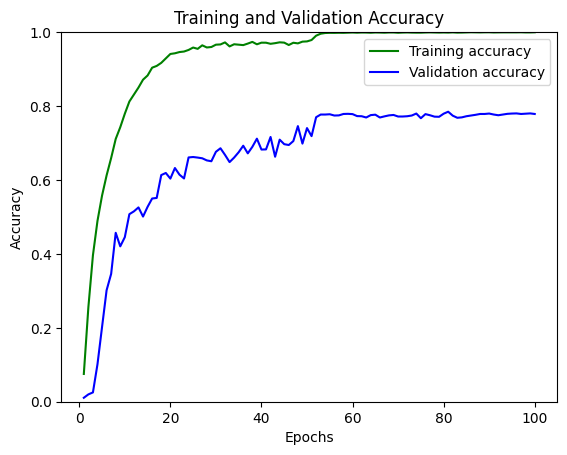

In [42]:
plot_model_accuracy(history)

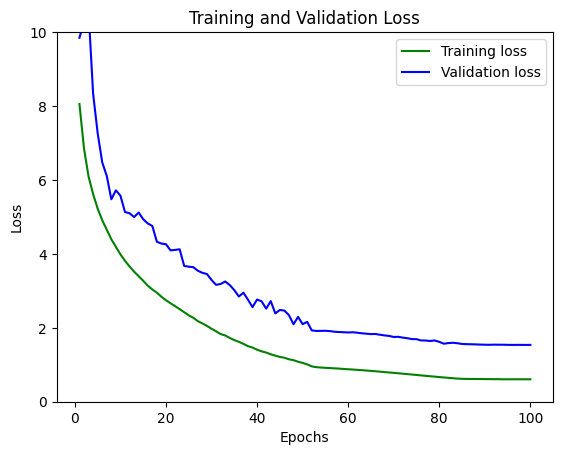

In [43]:
plot_model_loss(history)

Spremanje modela

In [44]:
model.save('EpsilonModel.h5')

82/82 ━━━━━━━━━━━━━━━━━━━━ 33s 389ms/step - accuracy: 0.7680 - loss: 1.6134
82/82 ━━━━━━━━━━━━━━━━━━━━ 33s 393ms/step
Classification Report:

              precision    recall  f1-score   support

           0       0.92      0.79      0.85        28
           1       0.88      0.67      0.76        21
           2       0.73      0.86      0.79        22
           3       1.00      0.88      0.94        25
           4       0.80      0.86      0.83        28
           5       0.84      0.77      0.81        35
           6       0.95      0.81      0.88        43
           7       0.95      0.72      0.82        25
           8       0.88      0.96      0.92        24
           9       0.96      0.89      0.93        28
          10       0.82      0.72      0.77        25
          11       0.56      0.64      0.60        22
          12       0.51      0.83      0.63        36
          13       0.85      0.89      0.87        19
          14       0.76      0.54      0.63    

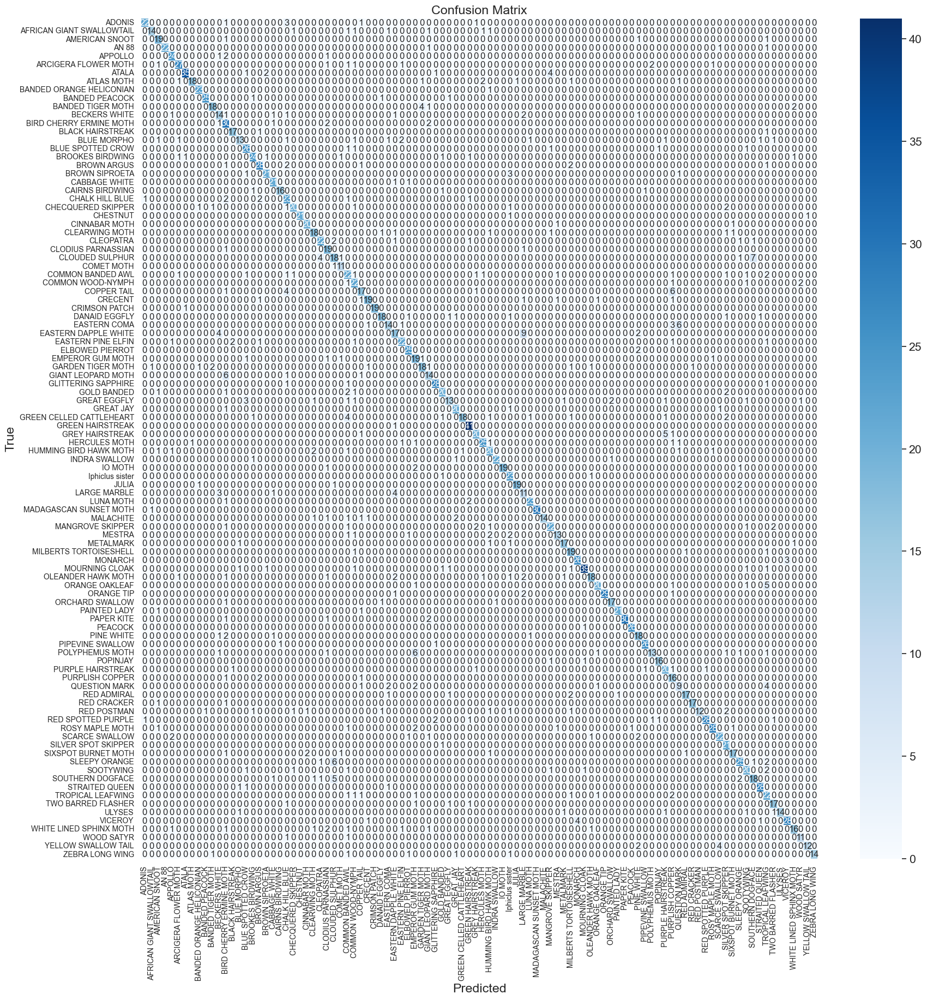

In [50]:
conf_matrix = generate_report_and_matrix('EpsilonModel.h5', X_val, y_val)
plot_confusion_matrix(conf_matrix, category_names=butterflies)

Transfer learning

In [51]:
# Configuration
num_classes = 100  
input_shape = (128, 128, 3) 

# Load MobileNetV2 without the top layer
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

# Build the model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.01))(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Unfreeze the last 30 layers of the base model for fine-tuning
for layer in base_model.layers[-30:]:
    layer.trainable = True


model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "functional_182"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 64, 64,    │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 64, 64,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 64, 64,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 64, 64,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 64, 64,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 64, 64,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 64, 64,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 64, 64,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 65, 65,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 32, 32,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 32, 32,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 32, 32,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 32, 32,    │      2,304 │ block_1_depthwis

 Total params: 3,672,228 (14.01 MB)

 Trainable params: 3,638,116 (13.88 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [52]:
# Compile the model
start_time = time.time()
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Setup callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3)

# Train the model
history = model.fit(X_train, y_train, batch_size=32, epochs=200, validation_data=(X_val, y_val),
                     callbacks=[lr_scheduler, early_stopping])
end_time = time.time()

print(f"Training completed in {(end_time - start_time):.2f} seconds")

Epoch 1/200
328/328 ━━━━━━━━━━━━━━━━━━━━ 396s 1s/step - accuracy: 0.4165 - loss: 9.8692 - val_accuracy: 0.1955 - val_loss: 6.4714 - learning_rate: 0.0010
Epoch 2/200
328/328 ━━━━━━━━━━━━━━━━━━━━ 359s 1s/step - accuracy: 0.7551 - loss: 2.1468 - val_accuracy: 0.1019 - val_loss: 7.8920 - learning_rate: 0.0010
Epoch 3/200
328/328 ━━━━━━━━━━━━━━━━━━━━ 363s 1s/step - accuracy: 0.8297 - loss: 1.4692 - val_accuracy: 0.2398 - val_loss: 4.9244 - learning_rate: 0.0010
Epoch 4/200
328/328 ━━━━━━━━━━━━━━━━━━━━ 351s 1s/step - accuracy: 0.8575 - loss: 1.2812 - val_accuracy: 0.3589 - val_loss: 3.5476 - learning_rate: 0.0010
Epoch 5/200
328/328 ━━━━━━━━━━━━━━━━━━━━ 346s 1s/step - accuracy: 0.8724 - loss: 1.2004 - val_accuracy: 0.3425 - val_loss: 3.7495 - learning_rate: 0.0010
Epoch 6/200
328/328 ━━━━━━━━━━━━━━━━━━━━ 339s 1s/step - accuracy: 0.8795 - loss: 1.1485 - val_accuracy: 0.3841 - val_loss: 3.8875 - learning_rate: 0.0010
Epoch 7/200
328/328 ━━━━━━━━━━━━━━━━━━━━ 341s 1s/step - accuracy: 0.8939 - l

In [53]:
print_training_results(history, start_time, end_time)

Training duration: 16973.7995 seconds
Final training accuracy: 0.9997
Final validation accuracy: 0.9339
Final training loss: 0.259
Final validation loss: 0.5404


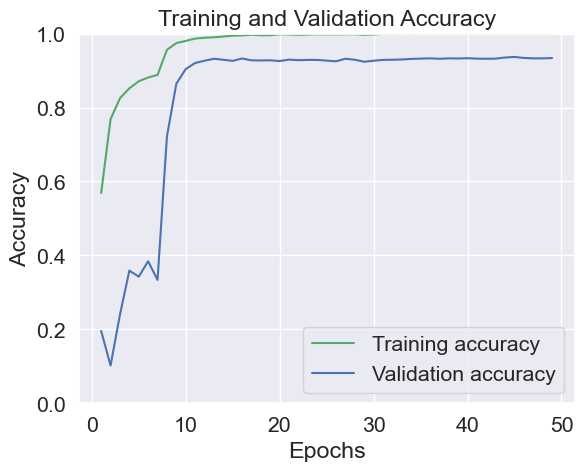

In [54]:
plot_model_accuracy(history)

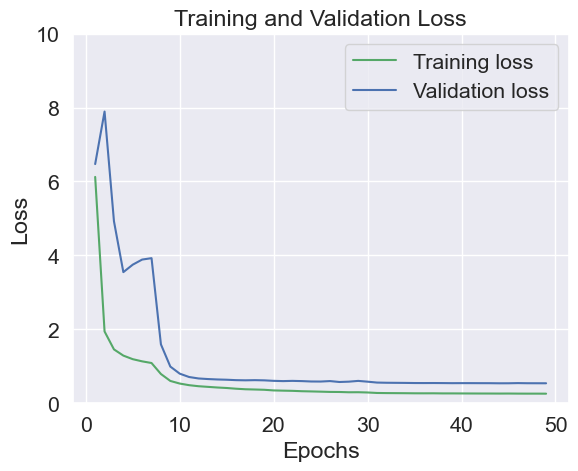

In [55]:
plot_model_loss(history)

In [56]:
model.save('TL_MNV2.h5')

82/82 ━━━━━━━━━━━━━━━━━━━━ 18s 193ms/step - accuracy: 0.9316 - loss: 0.5743
82/82 ━━━━━━━━━━━━━━━━━━━━ 21s 235ms/step
Classification Report:

              precision    recall  f1-score   support

           0       1.00      0.96      0.98        28
           1       1.00      0.90      0.95        21
           2       0.96      1.00      0.98        22
           3       1.00      1.00      1.00        25
           4       0.96      0.96      0.96        28
           5       0.97      0.91      0.94        35
           6       1.00      0.98      0.99        43
           7       0.86      1.00      0.93        25
           8       0.96      1.00      0.98        24
           9       1.00      0.93      0.96        28
          10       0.91      0.84      0.88        25
          11       0.91      0.91      0.91        22
          12       0.97      0.97      0.97        36
          13       0.90      0.95      0.92        19
          14       0.88      0.92      0.90    

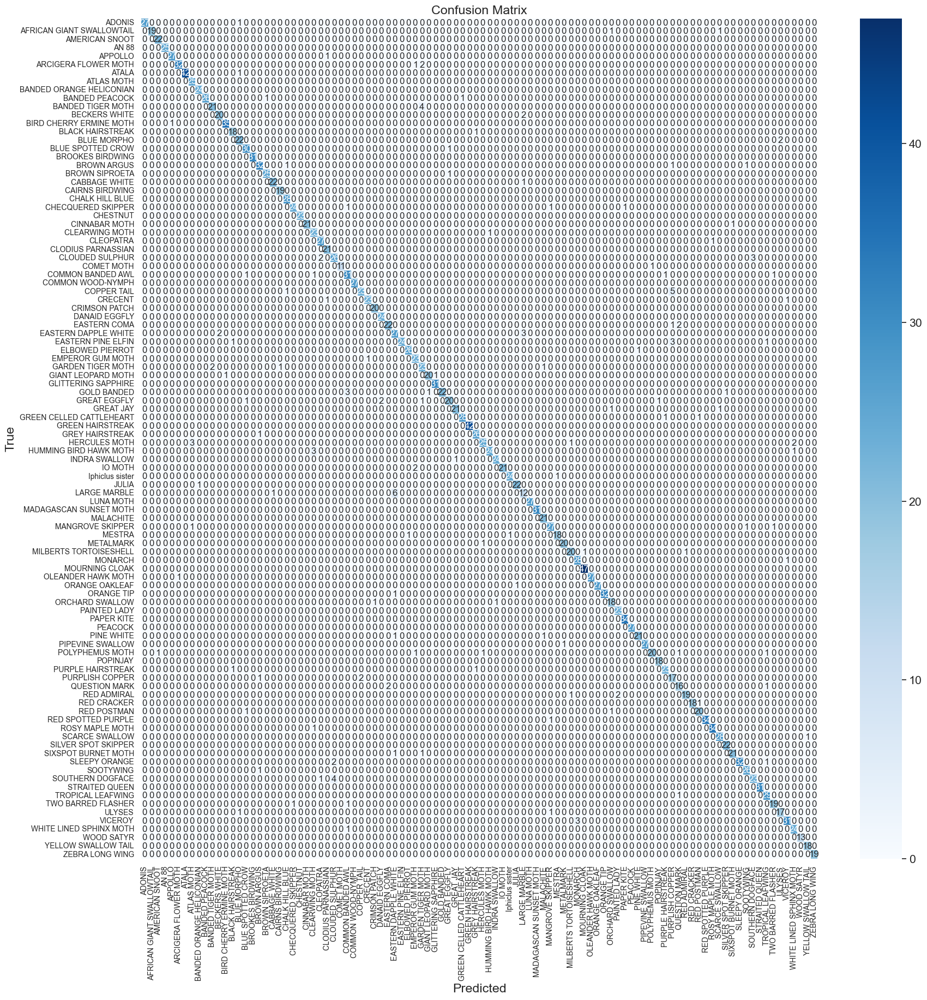

In [57]:
conf_matrix = generate_report_and_matrix('TL_MNV2.h5', X_val, y_val)
plot_confusion_matrix(conf_matrix, category_names=butterflies)

Testiranje modela

In [58]:
# Directory for test data
test_data_dir_path = 'test data'
test_data_dir = pathlib.Path(test_data_dir_path)

# Function to create a dictionary with categories and their labels
def create_category_dict(directory):
    category_dict = {}
    for i, category_path in enumerate(sorted(directory.iterdir())):
        if category_path.is_dir():
            category_dict[category_path.name] = {
                'images': list(category_path.glob('*')),
                'label': i
            }
    return category_dict

# Create the dictionary for test data
test_butterflies_dict = create_category_dict(test_data_dir)

# Display information
for category, info in list(test_butterflies_dict.items())[:5]:
    print(f"Category: {category}, Number of images: {len(info['images'])}, Label: {info['label']}")

# Count total number of images
total_images = sum(len(info['images']) for info in test_butterflies_dict.values())
print(f"Total number of images in test data: {total_images}")


Category: ADONIS, Number of images: 5, Label: 0
Category: AFRICAN GIANT SWALLOWTAIL, Number of images: 5, Label: 1
Category: AMERICAN SNOOT, Number of images: 5, Label: 2
Category: AN 88, Number of images: 5, Label: 3
Category: APPOLLO, Number of images: 5, Label: 4
Total number of images in test data: 500


In [62]:
# Checking dimensions of images
image_size_check(test_butterflies_dict)

butterflies_names = list(test_butterflies_dict.keys())

In [60]:
X_test, y_test = [], []

for category_name, category_info in test_butterflies_dict.items():
    for image_path in category_info['images']:
        img = cv2.imread(str(image_path))
        if img is not None:
            X_test.append(img)
            y_test.append(category_info['label'])
        else:
            print(f"Image at {image_path} could not be read.")

# Convert lists to numpy arrays
X_test = np.array(X_test)
y_test = np.array(y_test)

# Normalization of the images
X_test = X_test / 255.0

16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step


16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - accuracy: 0.7937 - loss: 1.4436
16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 234ms/step
Classification Report:

              precision    recall  f1-score   support

           0       1.00      0.80      0.89         5
           1       1.00      1.00      1.00         5
           2       0.50      0.60      0.55         5
           3       1.00      1.00      1.00         5
           4       0.57      0.80      0.67         5
           5       0.62      1.00      0.77         5
           6       1.00      0.80      0.89         5
           7       1.00      0.60      0.75         5
           8       0.80      0.80      0.80         5
           9       1.00      0.60      0.75         5
          10       0.75      0.60      0.67         5
          11       0.57      0.80      0.67         5
          12       0.62      1.00      0.77         5
          13       0.62      1.00      0.77         5
          14       1.00      0.60      0.75      

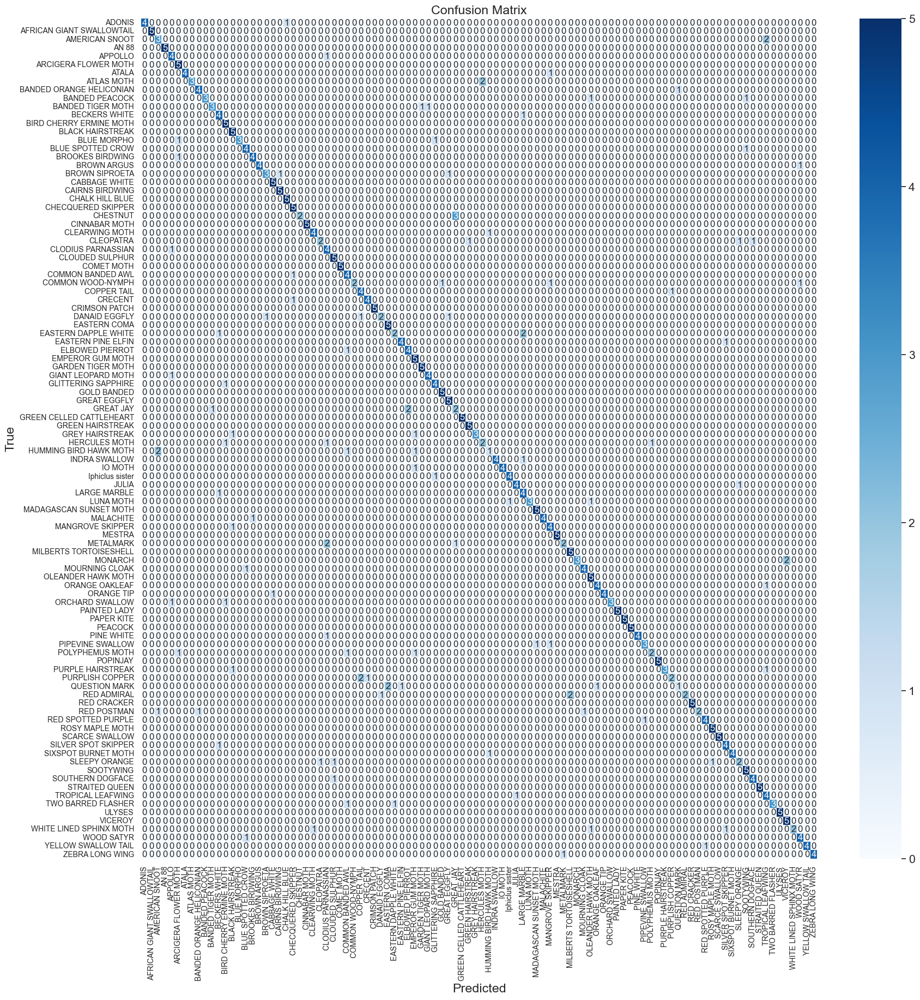

<Figure size 2000x800 with 0 Axes>

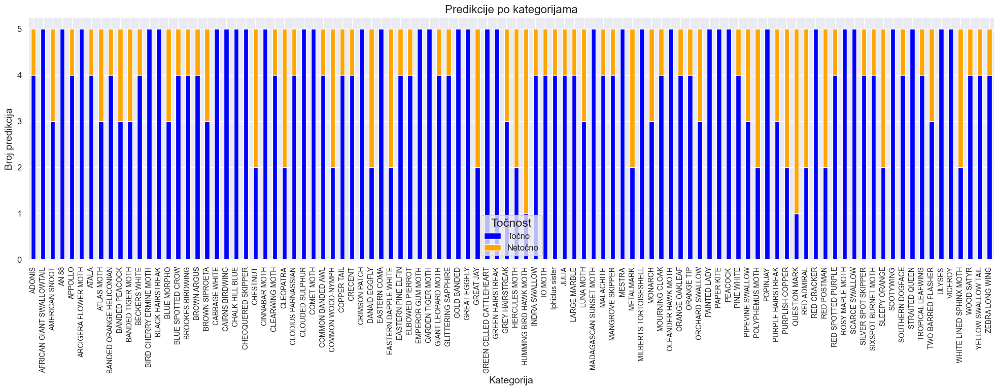

In [66]:
best_model = models.load_model('EpsilonModel.h5')
y_pred = best_model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

conf_matrix = generate_report_and_matrix('EpsilonModel.h5', X_test, y_test)

plot_confusion_matrix(conf_matrix, butterflies_names)
plot_predictions(y_test, y_pred_classes, butterflies_names)

16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 303ms/step


16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 215ms/step - accuracy: 0.9453 - loss: 0.4814
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 264ms/step
Classification Report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         5
           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00         5
           3       1.00      1.00      1.00         5
           4       0.83      1.00      0.91         5
           5       1.00      1.00      1.00         5
           6       1.00      1.00      1.00         5
           7       0.80      0.80      0.80         5
           8       1.00      1.00      1.00         5
           9       1.00      0.80      0.89         5
          10       0.80      0.80      0.80         5
          11       1.00      1.00      1.00         5
          12       1.00      1.00      1.00         5
          13       1.00      1.00      1.00         5
          14       1.00      1.00      1.00      

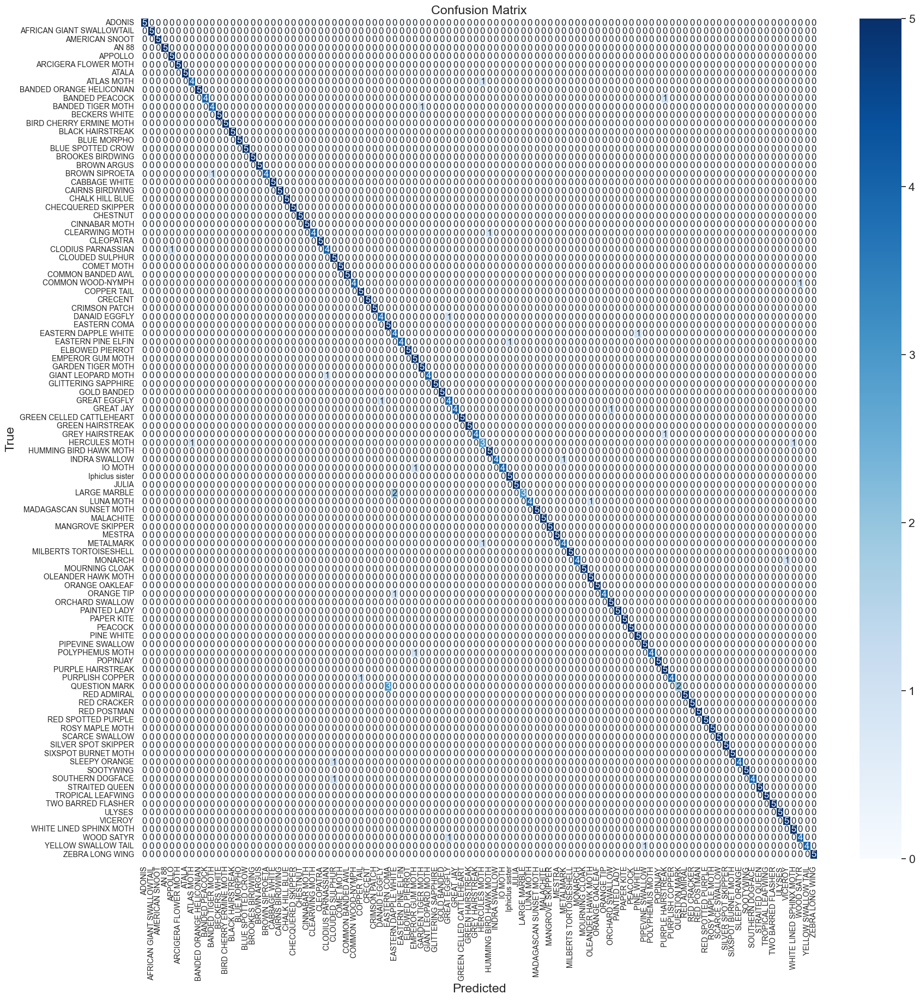

<Figure size 2000x800 with 0 Axes>

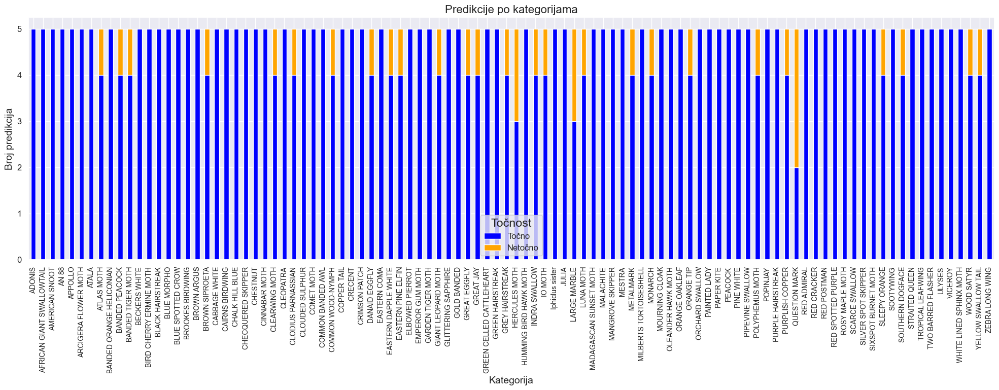

In [67]:
best_model = models.load_model('TL_MNV2.h5')
y_pred = best_model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

conf_matrix = generate_report_and_matrix('TL_MNV2.h5', X_test, y_test)

plot_confusion_matrix(conf_matrix, butterflies_names)
plot_predictions(y_test, y_pred_classes, butterflies_names)